In [ ]:
pip install opendatasets

In [ ]:
import opendatasets as od

In [ ]:
od.download("https://www.kaggle.com/datasets/pranavraikokte/covid19-image-dataset/data")

Skipping, found downloaded files in "./covid19-image-dataset" (use force=True to force download)


In [ ]:
data_dir = "/content/covid19-image-dataset/Covid19-dataset"

In [ ]:
import os

os.listdir(data_dir)

['train', 'test']

In [ ]:
train_dir = data_dir + "/train"
test_dir = data_dir + "/test"

In [ ]:
os.listdir(train_dir)

['Normal', 'Covid', 'Viral Pneumonia']

In [ ]:
os.listdir(test_dir)

['Normal', 'Covid', 'Viral Pneumonia']

In [ ]:
from torchvision.datasets import ImageFolder

In [ ]:
dataset = ImageFolder(data_dir)
dataset

Dataset ImageFolder
    Number of datapoints: 317
    Root location: /content/covid19-image-dataset/Covid19-dataset

In [ ]:
train_folder = ImageFolder(train_dir)
test_folder = ImageFolder(test_dir)

In [ ]:
train_folder

Dataset ImageFolder
    Number of datapoints: 251
    Root location: /content/covid19-image-dataset/Covid19-dataset/train

In [ ]:
test_folder

Dataset ImageFolder
    Number of datapoints: 66
    Root location: /content/covid19-image-dataset/Covid19-dataset/test

In [ ]:
for dirpath, dirnames, filenames in os.walk(data_dir):
  print(f"There are {len(dirnames)} directories and {len(filenames)} files in {dirpath}\n")

There are 2 directories and 0 files in /content/covid19-image-dataset/Covid19-dataset

There are 3 directories and 0 files in /content/covid19-image-dataset/Covid19-dataset/train

There are 0 directories and 70 files in /content/covid19-image-dataset/Covid19-dataset/train/Normal

There are 0 directories and 111 files in /content/covid19-image-dataset/Covid19-dataset/train/Covid

There are 0 directories and 70 files in /content/covid19-image-dataset/Covid19-dataset/train/Viral Pneumonia

There are 3 directories and 0 files in /content/covid19-image-dataset/Covid19-dataset/test

There are 0 directories and 20 files in /content/covid19-image-dataset/Covid19-dataset/test/Normal

There are 0 directories and 26 files in /content/covid19-image-dataset/Covid19-dataset/test/Covid

There are 0 directories and 20 files in /content/covid19-image-dataset/Covid19-dataset/test/Viral Pneumonia



In [ ]:
train_folder.classes

['Covid', 'Normal', 'Viral Pneumonia']

In [ ]:
classes = train_folder.classes
classes

['Covid', 'Normal', 'Viral Pneumonia']

- There are 70 files of Normal in train set.
- There are 111 files of Covid in train set.
- There are 70 files of Viral Pneumonia in train set.

In [ ]:
train_folder[112]

(<PIL.Image.Image image mode=RGB size=1600x1264>, 1)

## Visualize images

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

`<PIL.Image.Image>`, is a PIL image object, and `1` is the label of the image. In this case, `Normal` is the class label for the 112th image.

(1600, 1264)


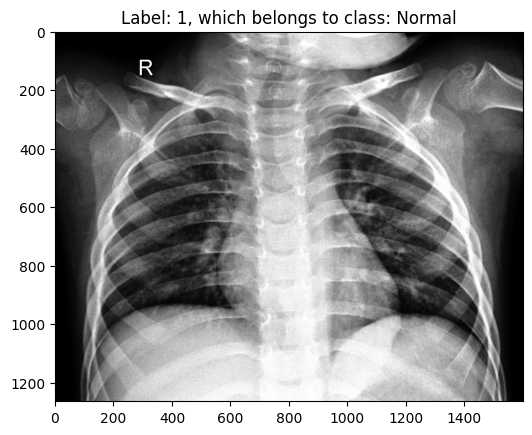

In [ ]:
img, label = train_folder[112]

plt.imshow(img)
plt.title(f"Label: {label}, which belongs to class: {classes[label]}")
print(img.size)

(1336, 1024)


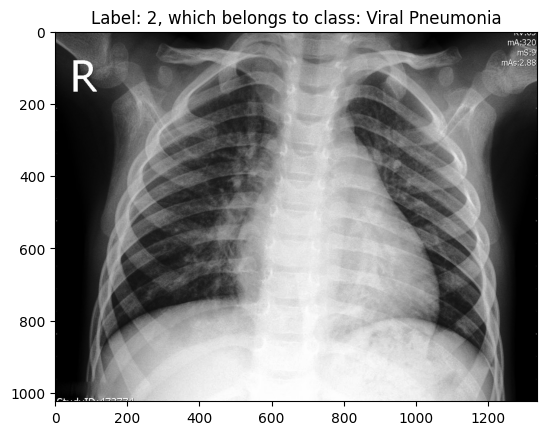

In [ ]:
img, label = train_folder[200]

plt.imshow(img)
plt.title(f"Label: {label}, which belongs to class: {classes[label]}")
print(img.size)

(1695, 1570)


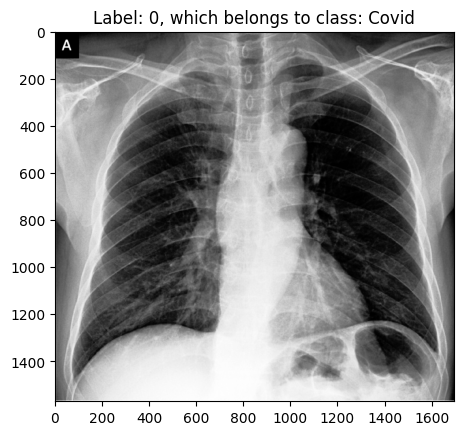

In [ ]:
img, label = train_folder[29]

plt.imshow(img)
plt.title(f"Label: {label}, which belongs to class: {classes[label]}")
print(img.size)

## Transformation and Augmentation

In [ ]:
import torchvision.transforms as transform

In [ ]:
train_set = ImageFolder(train_dir, transform.Compose([
    transform.Resize((250, 250)),            # Resize image to 256x256
    transform.RandomHorizontalFlip(p=0.5),   # Randomly flip the image horizontally
    transform.ToTensor(),                    # Convert the image to a PyTorch tensor
    transform.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
]))


test_set = ImageFolder(test_dir, transform.Compose([
    transform.Resize((250, 250)),
    transform.RandomHorizontalFlip(p=0.5),
    transform.ToTensor(),
    transform.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
]))

In [ ]:
train_set

Dataset ImageFolder
    Number of datapoints: 251
    Root location: /content/covid19-image-dataset/Covid19-dataset/train
    StandardTransform
Transform: Compose(
               Resize(size=(250, 250), interpolation=bilinear, max_size=None, antialias=True)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

## Visualize transformed images

<built-in method size of Tensor object at 0x7df8a8e325c0>


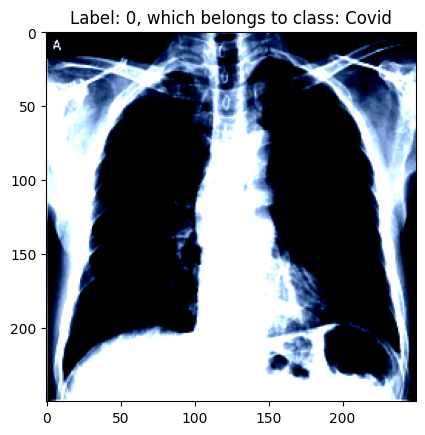

In [ ]:
img, label = train_set[29]

plt.imshow(img.permute(1, 2, 0))
plt.title(f"Label: {label}, which belongs to class: {classes[label]}")
print(img.size)

<built-in method size of Tensor object at 0x7df8a8d8a570>


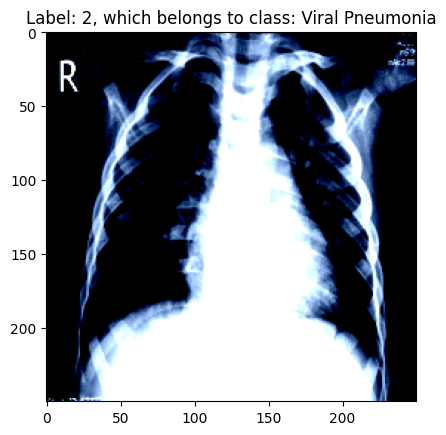

In [ ]:
img, label = train_set[200]

plt.imshow(img.permute(1, 2, 0))
plt.title(f"Label: {label}, which belongs to class: {classes[label]}")
print(img.size)

<built-in method size of Tensor object at 0x7df8a8e773d0>


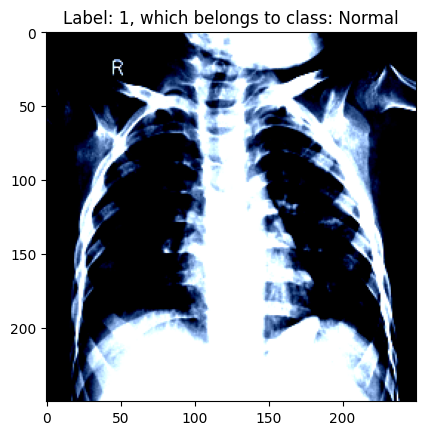

In [ ]:
img, label = train_set[112]

plt.imshow(img.permute(1, 2, 0))
plt.title(f"Label: {label}, which belongs to class: {classes[label]}")
print(img.size)

## Create dataloaders

In [ ]:
len(train_set)

251

In [ ]:
val_pct = 0.25
val_size = int(val_pct * len(train_set))
train_size = int(len(train_set) - val_size)

val_size, train_size

(62, 189)

In [ ]:
from torch.utils.data import random_split

In [ ]:
train_ds, val_ds = random_split(train_set, [train_size, val_size])

len(train_ds), len(val_ds)

(189, 62)

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from torch.utils.data.dataloader import DataLoader

In [ ]:
train_dl = DataLoader(train_ds, batch_size=8, shuffle=True, num_workers=2, pin_memory=True)
val_dl = DataLoader(val_ds, batch_size=8, shuffle=False, num_workers=2, pin_memory=True)

## Visualize a batch of data

In [ ]:
from torchvision.utils import make_grid
import torchvision

In [ ]:
def visualize_batch(images, labels):
  grid_img = torchvision.utils.make_grid(images, nrow=8, padding=2)

  np_img = grid_img.numpy().transpose((1, 2, 0))

  plt.figure(figsize=(15, 15))
  plt.imshow(np_img)
  plt.title("Batch of images with labels")
  plt.axis("off")
  plt.show()

  for i in range(len(images)):
    img = images[i]
    label = labels[i].item()

    img = img.permute(1, 2, 0).numpy()

    plt.figure()
    plt.imshow(img)
    plt.title(f"Label: {label}, which is {classes[label]}")
    plt.axis("off")
    plt.show()

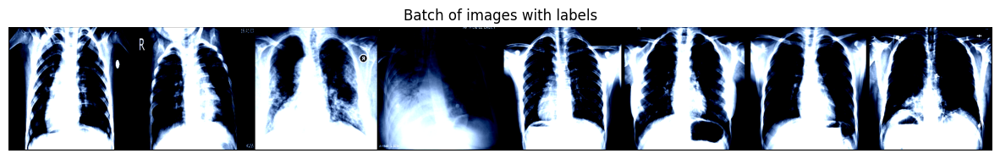

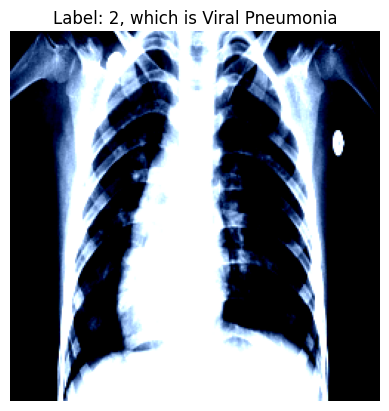

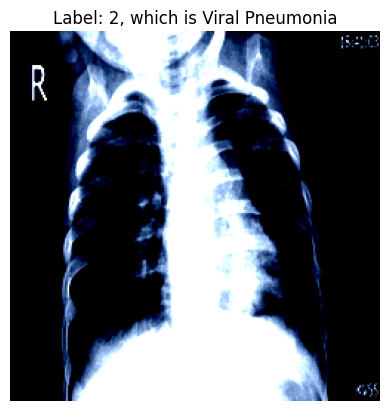

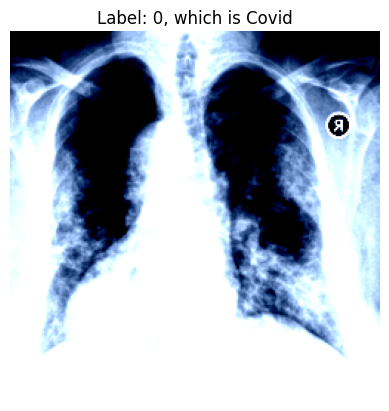

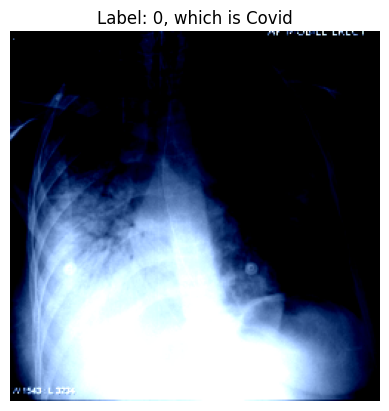

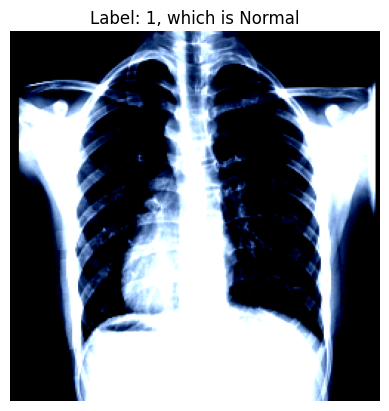

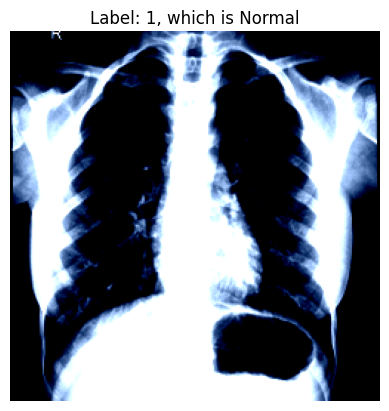

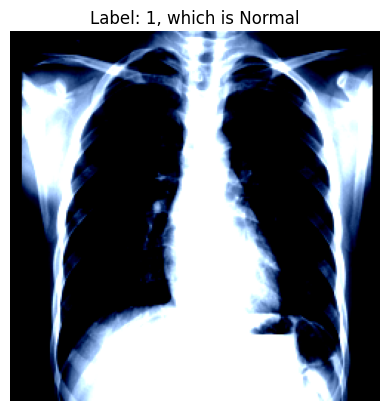

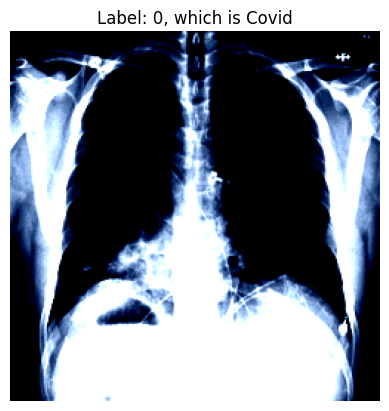

In [ ]:
for batch in train_dl:
  images, labels = batch
  visualize_batch(images, labels)
  break

## Define the model

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np

meaning of parameters in torch.nn.Conv2d: https://stackoverflow.com/questions/56675943/meaning-of-parameters-in-torch-nn-conv2d

In [ ]:
class Covid19Model0(nn.Module):
  def __init__(self):
    super(Covid19Model0, self).__init__()

    # Convolutional layers
    self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
    self.dropout1 = nn.Dropout(0.5)  # Dropout after conv1
    self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
    self.dropout2 = nn.Dropout(0.5)  # Dropout after conv2
    self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
    self.dropout3 = nn.Dropout(0.5)  # Dropout after conv3

    # Pooling layer
    self.pool = nn.MaxPool2d(2, 2)

    # Fully connected layers
    self.linear1 = nn.Linear(128 * 31 * 31, 256)
    self.dropout4 = nn.Dropout(0.5)  # Dropout after linear1
    self.linear2 = nn.Linear(256, 128)
    self.dropout5 = nn.Dropout(0.5)  # Dropout after linear2
    self.linear3 = nn.Linear(128, 64)
    self.dropout6 = nn.Dropout(0.5)  # Dropout after linear3
    self.linear4 = nn.Linear(64, 3)   # Output layer for 3 classes

  def forward(self, x):
    # Forward pass through the network
    x = F.relu(self.conv1(x))
    x = self.dropout1(x)
    x = self.pool(x)

    x = F.relu(self.conv2(x))
    x = self.dropout2(x)
    x = self.pool(x)

    x = F.relu(self.conv3(x))
    x = self.dropout3(x)
    x = self.pool(x)

    # Flatten the tensor for the fully connected layers
    x = x.view(-1, 128 * 31 * 31)

    x = F.relu(self.linear1(x))
    x = self.dropout4(x)

    x = F.relu(self.linear2(x))
    x = self.dropout5(x)

    x = F.relu(self.linear3(x))
    x = self.dropout6(x)

    x = self.linear4(x)  # Output layer
    return x

In [ ]:
model0 = Covid19Model0()
model0

Covid19Model0(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (dropout1): Dropout(p=0.5, inplace=False)
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (dropout2): Dropout(p=0.5, inplace=False)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (dropout3): Dropout(p=0.5, inplace=False)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (linear1): Linear(in_features=123008, out_features=256, bias=True)
  (dropout4): Dropout(p=0.5, inplace=False)
  (linear2): Linear(in_features=256, out_features=128, bias=True)
  (dropout5): Dropout(p=0.5, inplace=False)
  (linear3): Linear(in_features=128, out_features=64, bias=True)
  (dropout6): Dropout(p=0.5, inplace=False)
  (linear4): Linear(in_features=64, out_features=3, bias=True)
)

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model0.parameters(), lr=0.001)

## Training loop

### finding accuracy of first batch of images, step by step implementation

In [ ]:
for images, labels in train_dl:
  outputs = model0(images)
  loss = criterion(outputs, labels)
  break

In [ ]:
labels

tensor([1, 1, 2, 2, 0, 0, 1, 1])

In [ ]:
labels.size()

torch.Size([8])

In [ ]:
labels.size(0)

8

In [ ]:
outputs

tensor([[-0.0208,  0.1118, -0.0182],
        [ 0.1709,  0.0704,  0.0403],
        [ 0.1507,  0.0805,  0.0488],
        [ 0.1487,  0.1480, -0.0452],
        [-0.1007,  0.1849,  0.0772],
        [ 0.1769,  0.0527,  0.0069],
        [ 0.0901,  0.1313, -0.0527],
        [ 0.0199,  0.1937,  0.0615]], grad_fn=<AddmmBackward0>)

In [ ]:
outputs.data

tensor([[-0.0208,  0.1118, -0.0182],
        [ 0.1709,  0.0704,  0.0403],
        [ 0.1507,  0.0805,  0.0488],
        [ 0.1487,  0.1480, -0.0452],
        [-0.1007,  0.1849,  0.0772],
        [ 0.1769,  0.0527,  0.0069],
        [ 0.0901,  0.1313, -0.0527],
        [ 0.0199,  0.1937,  0.0615]])

In [ ]:
torch.max(outputs.data, 1)

torch.return_types.max(
values=tensor([0.1118, 0.1709, 0.1507, 0.1487, 0.1849, 0.1769, 0.1313, 0.1937]),
indices=tensor([1, 0, 0, 0, 1, 0, 1, 1]))

In [ ]:
_, predicted = torch.max(outputs.data, 1)
print(f"{_}\n\n{predicted}")

tensor([0.1118, 0.1709, 0.1507, 0.1487, 0.1849, 0.1769, 0.1313, 0.1937])

tensor([1, 0, 0, 0, 1, 0, 1, 1])


In [ ]:
(predicted == labels)

tensor([ True, False, False, False, False,  True,  True,  True])

In [ ]:
(predicted == labels).sum()

tensor(4)

In [ ]:
(predicted == labels).sum().item()

4

In [ ]:
print(f"Accuracy of first batch of data: {((predicted == labels).sum().item() / labels.size(0)) * 100:.2f}%")

Accuracy of first batch of data: 50.00%


In [ ]:
loss

tensor(1.1002, grad_fn=<NllLossBackward0>)

In [ ]:
loss.item()

1.1001769304275513

In [ ]:
example_tensor = torch.tensor([[0.2, 1.5, 0.3],
                         [2.0, 0.5, 0.3],
                         [0.1, 0.4, 1.2]])

torch.max(example_tensor, 1) # returns the max from each row, and its indices

torch.return_types.max(
values=tensor([1.5000, 2.0000, 1.2000]),
indices=tensor([1, 0, 2]))

The `index 1` corresponds to the maximum value 1.5 in the first row.

The `index 0` corresponds to the maximum value 2.0 in the second row.

The `index 2` corresponds to the maximum value 1.2 in the third row.

We need the indices because they indicate which class corresponds to the highest predicted probability.



### training and evaluating loop for model0

In [ ]:
def train_model(model, train_loader, criterion, optimizer, num_epochs):
  model.train()

  epoch_losses = []
  epoch_accuracies = []

  for epoch in range(num_epochs):
    running_loss = 0.0
    correct_predictions = 0
    total_images = 0

    for images, labels in train_loader:
      outputs = model(images)
      loss = criterion(outputs, labels)

      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      running_loss += loss.item()

      _, predicted = torch.max(outputs.data, 1)
      total_images += labels.size(0)
      correct_predictions += (predicted == labels).sum().item()

    epoch_loss = running_loss / len(train_loader)
    epoch_accuracy = correct_predictions / total_images

    epoch_losses.append(epoch_loss)
    epoch_accuracies.append(epoch_accuracy)

    print(f"Epoch: [{epoch + 1}/{num_epochs}], Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy * 100:.2f}%")

  return epoch_losses, epoch_accuracies

In [ ]:
def evaluate_model(model, train_loader, val_loader):
  model.eval()

  # Evalute Training Set
  total_correct_train = 0
  total_images_train = 0

  with torch.no_grad():
    for images, labels in train_loader:
      outputs = model(images)
      _, predicted = torch.max(outputs.data, 1)
      total_images_train += labels.size(0)
      total_correct_train += (predicted == labels).sum().item()

  train_accuracy = total_correct_train / total_images_train
  print(f"Training accuracy: {train_accuracy*100:.2f}")

  # ============================================================================

  # Evalute Validation / Training Set
  total_correct_val = 0
  total_images_val = 0

  with torch.no_grad():
    for images, labels in val_loader:
      outputs = model(images)
      _, predicted = torch.max(outputs.data, 1)
      total_images_val += labels.size(0)
      total_correct_val += (predicted == labels).sum().item()

  val_accuracy = total_correct_val / total_images_val
  print(f"Validation/Test Accuracy: {val_accuracy*100:2f}")

In [ ]:
history0_0 = train_model(model0, train_dl, criterion, optimizer, num_epochs=10)

Epoch: [1/10], Loss: 1.4140, Accuracy: 41.27%
Epoch: [2/10], Loss: 1.0334, Accuracy: 46.56%
Epoch: [3/10], Loss: 0.7304, Accuracy: 66.67%
Epoch: [4/10], Loss: 0.5990, Accuracy: 72.49%
Epoch: [5/10], Loss: 0.5997, Accuracy: 74.07%
Epoch: [6/10], Loss: 0.5018, Accuracy: 79.89%
Epoch: [7/10], Loss: 0.4290, Accuracy: 84.13%
Epoch: [8/10], Loss: 0.4676, Accuracy: 82.54%
Epoch: [9/10], Loss: 0.4007, Accuracy: 82.01%
Epoch: [10/10], Loss: 0.4041, Accuracy: 81.48%


#### training and validation accuracy

In [ ]:
evaluate_model(model0, train_dl, val_dl)

Training accuracy: 93.65
Validation/Test Accuracy: 87.096774


## Visualizing images in test set

In [ ]:
test_dl = DataLoader(test_set, batch_size=8, shuffle=False, num_workers=2, pin_memory=True)

In [ ]:
test_dl

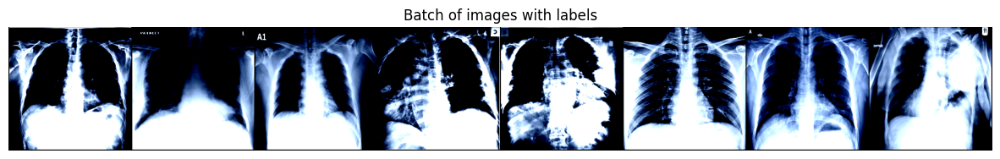

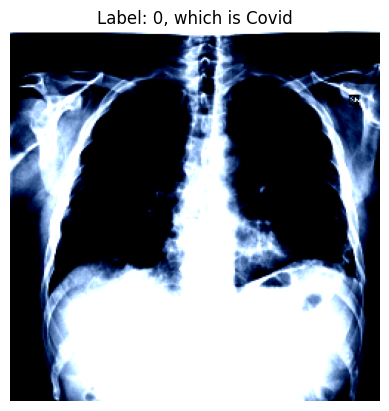

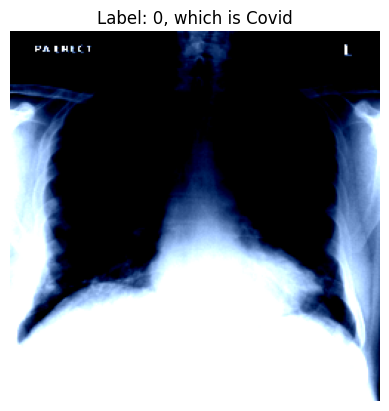

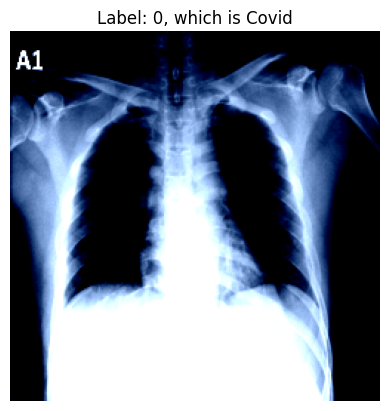

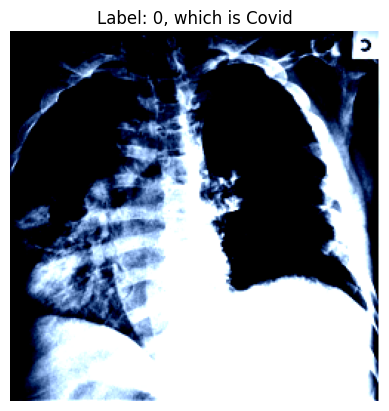

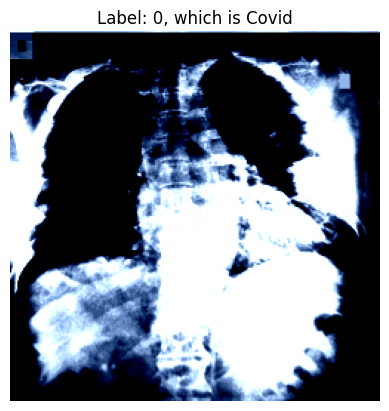

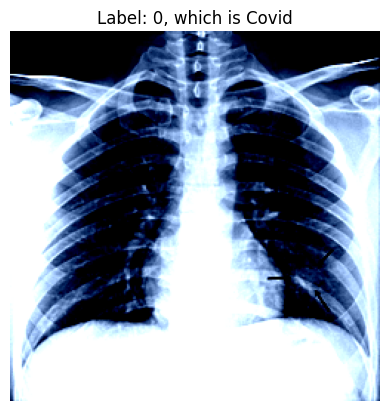

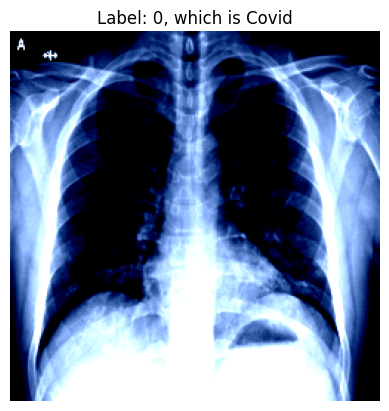

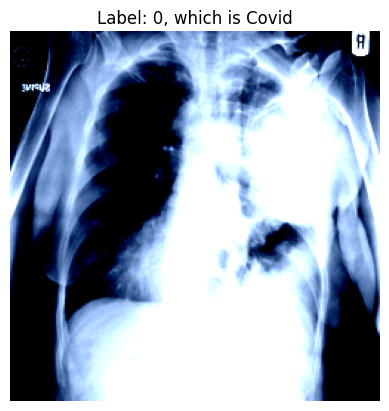

In [ ]:
for images, labels in test_dl:
  visualize_batch(images, labels)
  break

## Plot predictions

In [ ]:
import random
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader

plt.rcParams['axes.titlesize'] = 12

def plot_predictions(model, data_loader):
    model.eval()

    # Get the total number of images in the dataset
    total_images = len(data_loader.dataset)

    random_indices = random.sample(range(total_images), min(16, total_images))

    selected_images = []
    selected_labels = []

    for idx in random_indices:
        img, label = data_loader.dataset[idx]
        selected_images.append(img)
        selected_labels.append(label)

    # Convert the list of images to a tensor for batch processing
    selected_images = torch.stack(selected_images)
    selected_labels = torch.tensor(selected_labels)

    # Get the model outputs
    outputs = model(selected_images)
    _, predicted = torch.max(outputs.data, 1)

    plt.figure(figsize=(20, 20))
    num_images = selected_images.size(0)
    for i in range(num_images):
        plt.subplot(4, 4, i + 1)
        img = selected_images[i].permute(1, 2, 0).numpy()

        # Rescale the image if it's normalized
        img = (img - img.min()) / (img.max() - img.min())

        plt.imshow(img)
        plt.title(f'True: {classes[selected_labels[i]]}, Predicted: {classes[predicted[i]]}')
        plt.axis('off')

    plt.show()

### plot predictions of train set

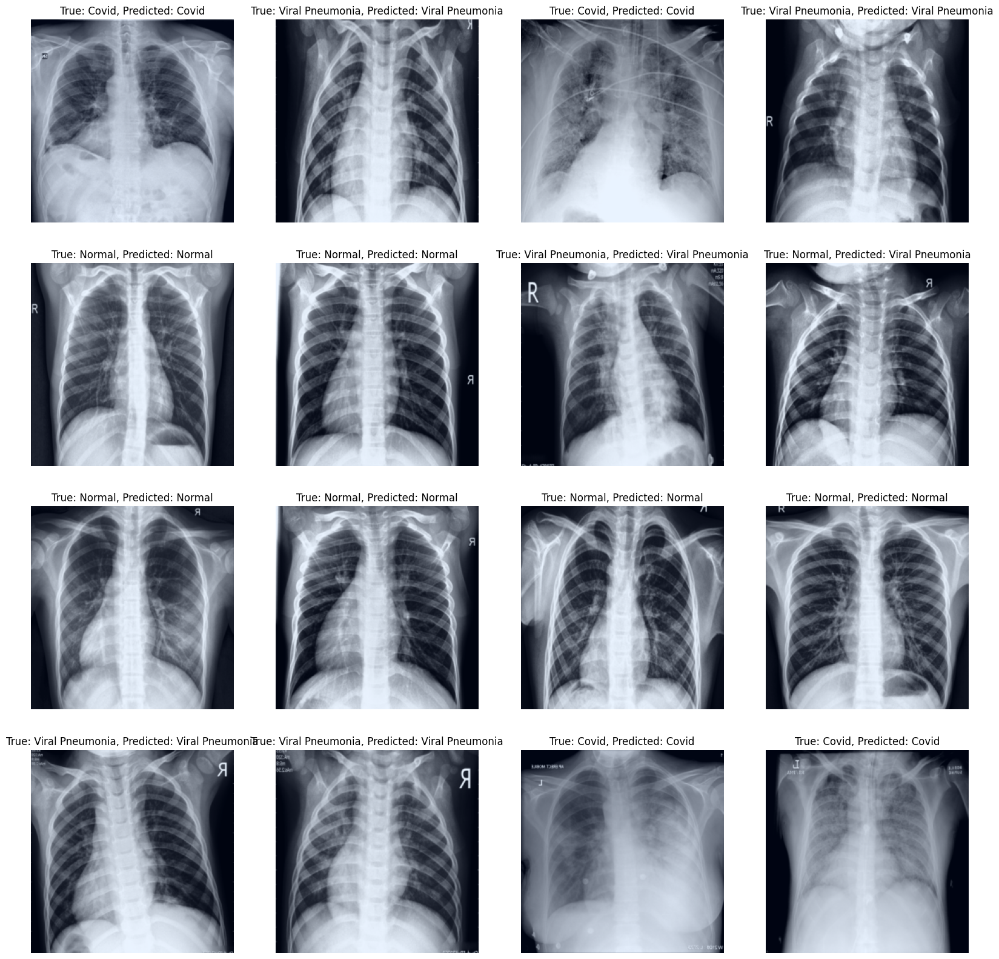

In [ ]:
plot_predictions(model0, train_dl)

### plot predictions of validation set

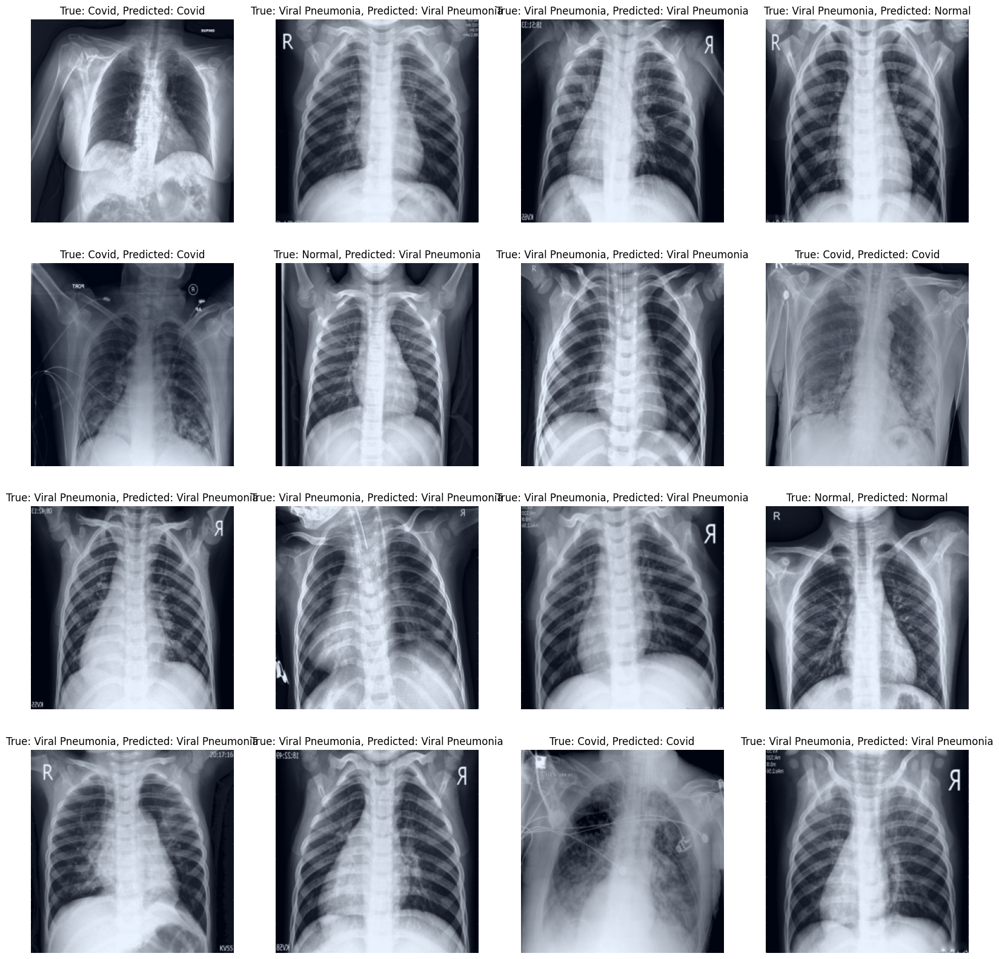

In [ ]:
plot_predictions(model0, val_dl)

### plot predictions of test set

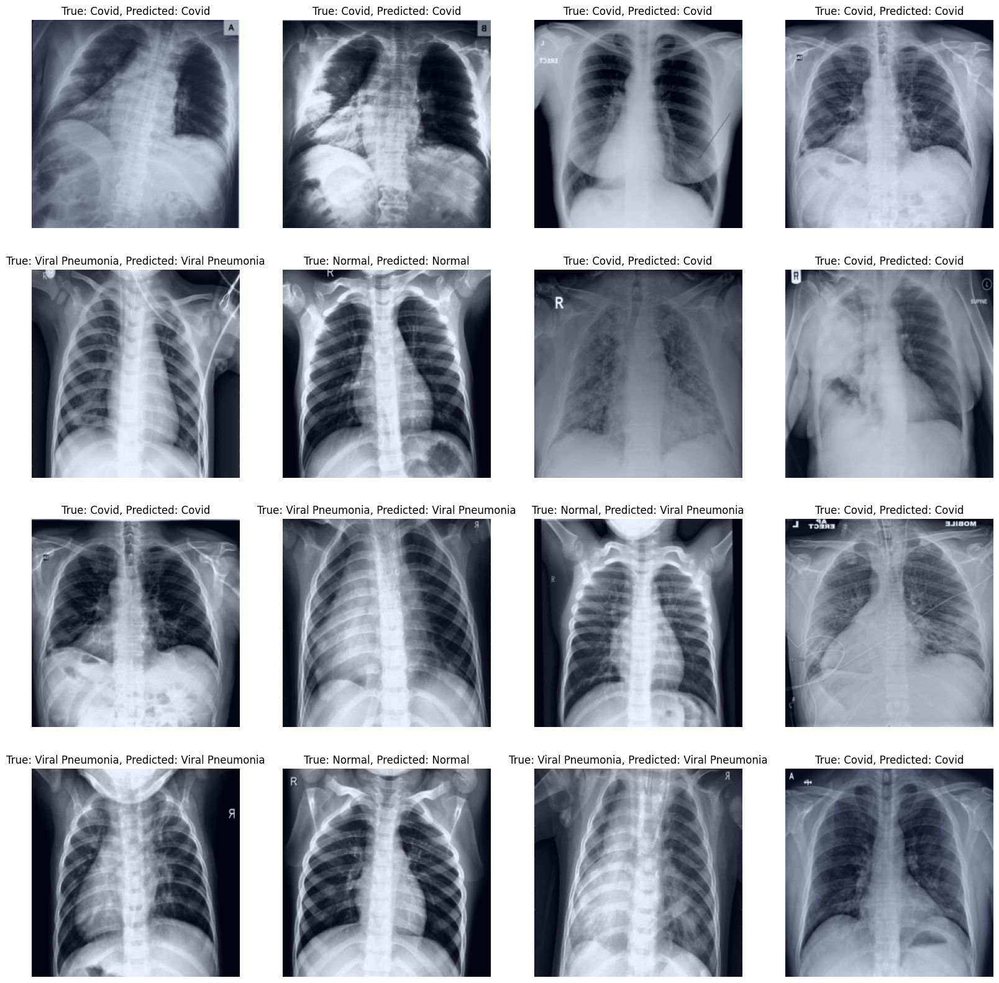

In [ ]:
plot_predictions(model0, test_dl)

#### training and test accuracy

In [ ]:
evaluate_model(model0, train_dl, test_dl)

Training accuracy: 93.65
Validation/Test Accuracy: 80.303030


## Plot loss and accuracy curves

In [ ]:
def plot_training_history(epoch_losses, epoch_accuracies):
  epochs = range(1, len(epoch_losses) + 1)

  plt.figure(figsize=(12, 5))

  # Plot loss
  plt.subplot(1, 2, 1)
  plt.plot(epochs, epoch_losses, 'b', label='Training loss')
  plt.title('Training Loss')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()

  # Plot accuracy
  plt.subplot(1, 2, 2)
  plt.plot(epochs, [acc * 100 for acc in epoch_accuracies], 'g', label='Training accuracy')
  plt.title('Training Accuracy')
  plt.xlabel('Epochs')
  plt.ylabel('Accuracy (%)')
  plt.legend()

  plt.show()

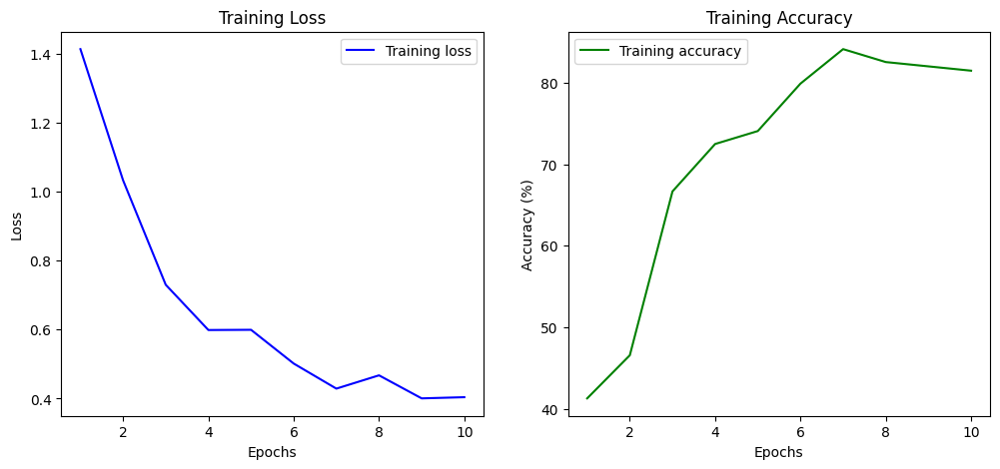

In [ ]:
epoch_losses, epoch_accuracies = history0_0
plot_training_history(epoch_losses, epoch_accuracies)

## Saving the model

In [ ]:
import os

In [ ]:
os.mkdir("models")

In [ ]:
model_path = "/content/models/model0.pth"

In [ ]:
torch.save(model0.state_dict(), model_path)